In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numba import njit,prange
from tqdm import tqdm
import ising

import os
import re


%load_ext autoreload
%autoreload 2

### Define the model to sample

In [7]:
foldername = "500x500_random"



nbH = 1
nbT = 101

n_configs = 10
n_therm = 300

hmax = 1

Ts = np.append(np.linspace(0.5,3.5,nbT),10)
Hs = np.linspace(0,hmax,nbH)
Ts = np.array([0.1])
Hs = np.array([0.])

L = 500

### Sample

In [8]:
if not os.path.exists(foldername):
    os.makedirs(foldername)

for j,h in enumerate(Hs):
    print('H = ',h)
    for i,t in enumerate(Ts):
        print(' T = ',t)
        all = ising.generate_parallel(L,t,h,n_configs,ising.n_thermalization(n_therm,t,h),0)
        filename = f"{foldername}/T={t:.2f},H={h:.2f}.bin"
        ising.save_configurations(filename,all,L,t,h)

H =  0.0
 T =  0.1


### Search all binary files and sort them

In [3]:
foldername = "100x100_random"
#foldername = "100x100_up"

extension = "bin"

all_files = np.array([f for f in os.listdir(foldername) if f.endswith(extension)])
Ts = np.zeros(len(all_files))
Hs = np.zeros(len(all_files))

for i,name in enumerate(all_files):
    Ts[i],Hs[i] = re.findall(r'-?\d*\.?\d+', name)

arg_T = np.argsort(Ts)
all_files = all_files[arg_T]
Ts = Ts[arg_T]
Hs = Hs[arg_T]

### Plot some configurations

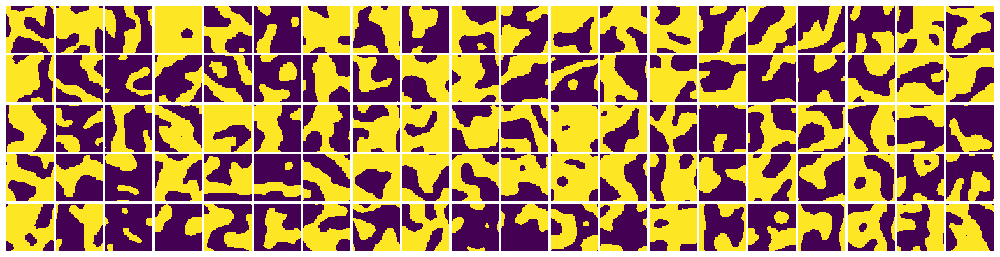

In [4]:
i = 1
ising.plot_configs_from_file(foldername + "/" + all_files[i],save=True)

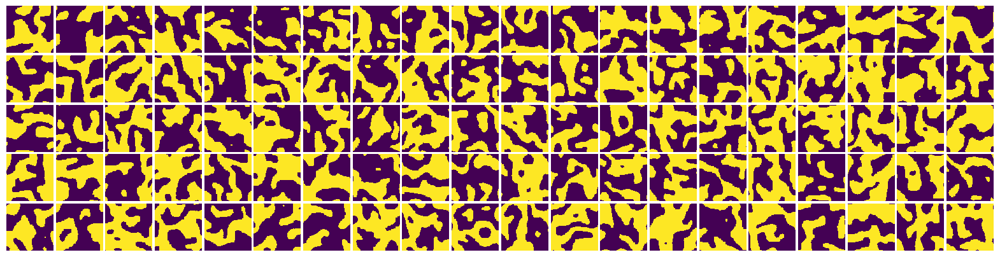

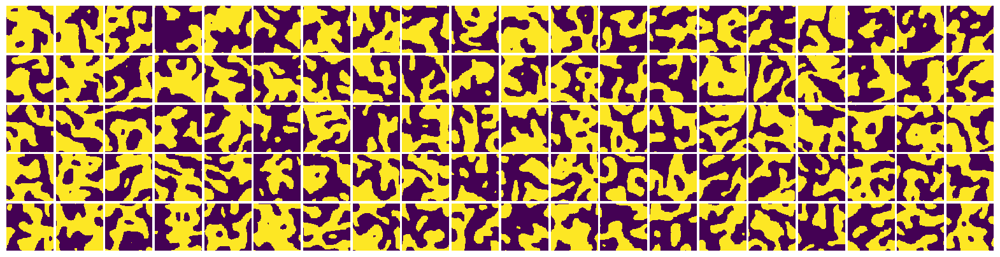

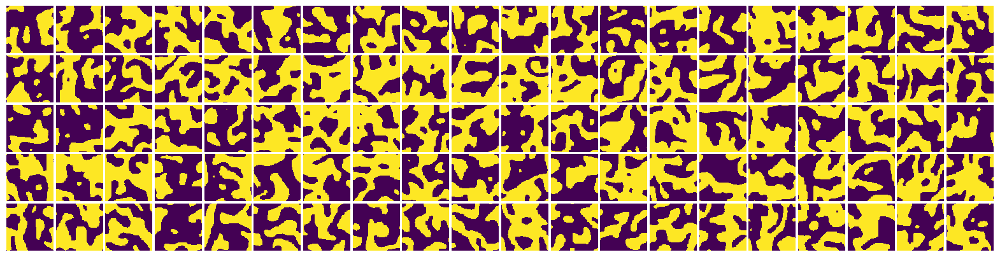

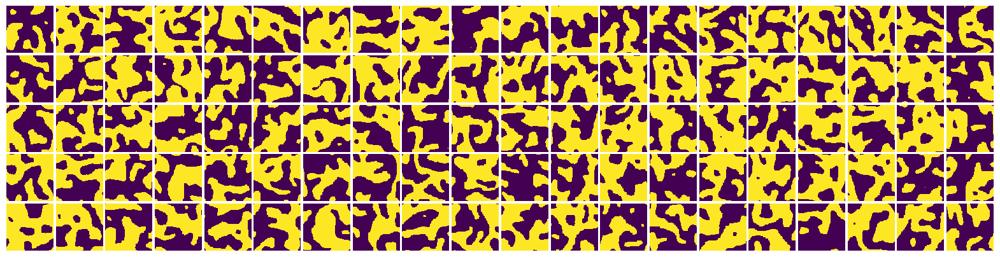

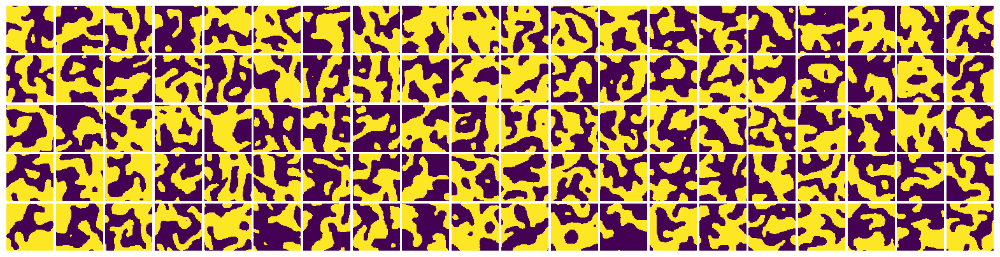

...

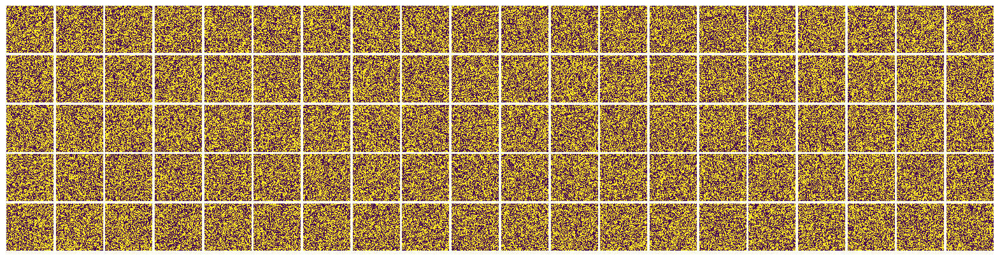

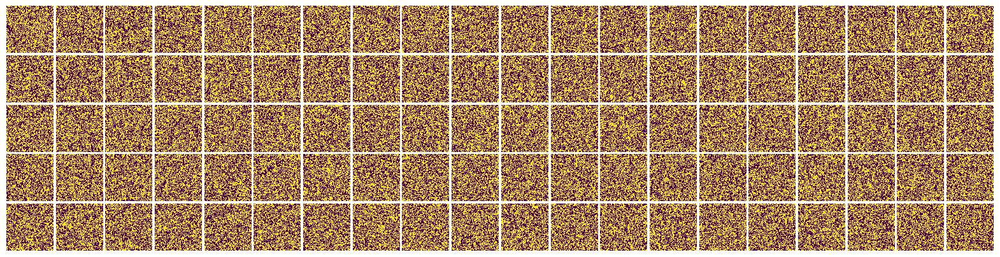

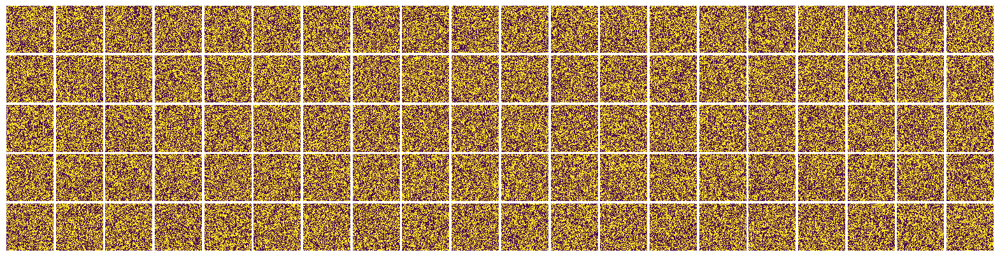

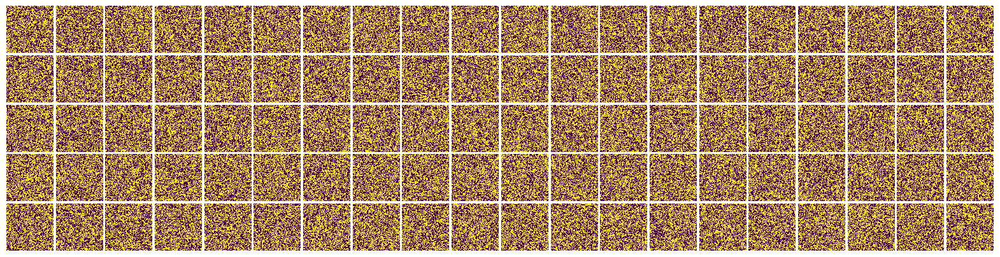

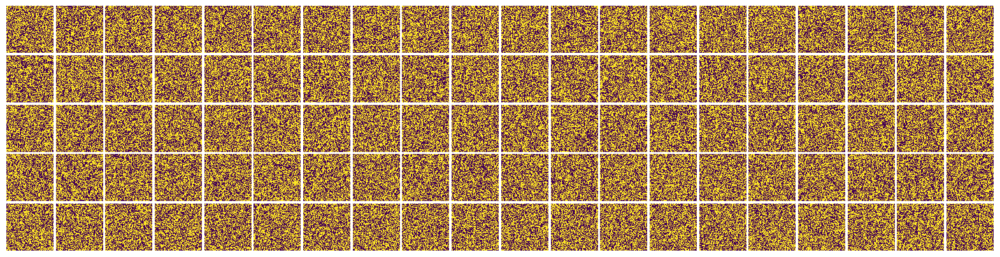

In [ ]:
for i,t in enumerate(Ts):
    grids,L,n_configs,T,H = ising.open_configurations(foldername + "/" + all_files[i])
    ising.plot_configs_from_grids(grids)#,save=foldername + "/"str(i))
    #print(T)
